<a href="https://colab.research.google.com/github/Sathyakumarnsk/action_classifier/blob/master/colab_detection_tf1good.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [2]:
import tensorflow as tf
tf.VERSION

'1.15.2'

In [3]:
 !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2224, done.
remote: Counting objects: 100% (2224/2224), done.
remote: Compressing objects: 100% (1924/1924), done.
remote: Total 2224 (delta 535), reused 974 (delta 275), pack-reused 0
Receiving objects: 100% (2224/2224), 30.47 MiB | 26.97 MiB/s, done.
Resolving deltas: 100% (535/535), done.


In [4]:
%cd models/research/

/content/models/research


In [5]:
!protoc object_detection/protos/*.proto --python_out=.

In [6]:
!cp object_detection/packages/tf1/setup.py .

In [7]:
pip install .

Processing /content/models/research
     |████████████████████████████████| 358kB 4.9MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1579551 sha256=ef4f75fac0c000d724a1991d79b51895a9f1feda57831f5961baa2d59e262e72
  Stored in directory: /tmp/pip-ephem-wheel-cache-uh4m6es1/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
Successfully built object-detection


In [8]:
!python object_detection/builders/model_builder_tf1_test.py

Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params0 (True)
[       OK ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params0 (True)
[ RUN      ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params1 (False)
[       OK ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params1 (False)
[ RUN      ] ModelBuilderTF1Test.test_create_experimental_model
[       OK ] ModelBuilderTF1Test.test_create_experimental_model
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature0 (True)
[       OK ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature0 (True)
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature1 (False)
[       OK ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature1 (False)
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_model_from_config_wi

In [9]:
import os
import cv2
import numpy as np

import tensorflow as tf
import sys


In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [47]:
CWD_PATH = os.getcwd()
MODEL_NAME = 'my_net'
IMAGE_NAME = 'test1.jpg'

# Path to frozen detection graph .pb file, which contains the model that is used
# for object detection.
PATH_TO_CKPT = os.path.join(CWD_PATH,MODEL_NAME,'frozen_inference_graph.pb')

# Path to label map file
PATH_TO_LABELS = os.path.join(CWD_PATH,'my_net','labelmap.pbtxt')

# Path to image
PATH_TO_IMAGE = os.path.join(CWD_PATH,IMAGE_NAME)

# Number of classes the object detector can identify
NUM_CLASSES = 5

In [48]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [49]:
category_index

{1: {'id': 1, 'name': 'basket'},
 2: {'id': 2, 'name': 'bottle'},
 3: {'id': 3, 'name': 'mug'},
 4: {'id': 4, 'name': 'chips'},
 5: {'id': 5, 'name': 'cup'}}

In [50]:
# Load the Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

    sess = tf.Session(graph=detection_graph)



In [51]:
from google.colab.patches import cv2_imshow

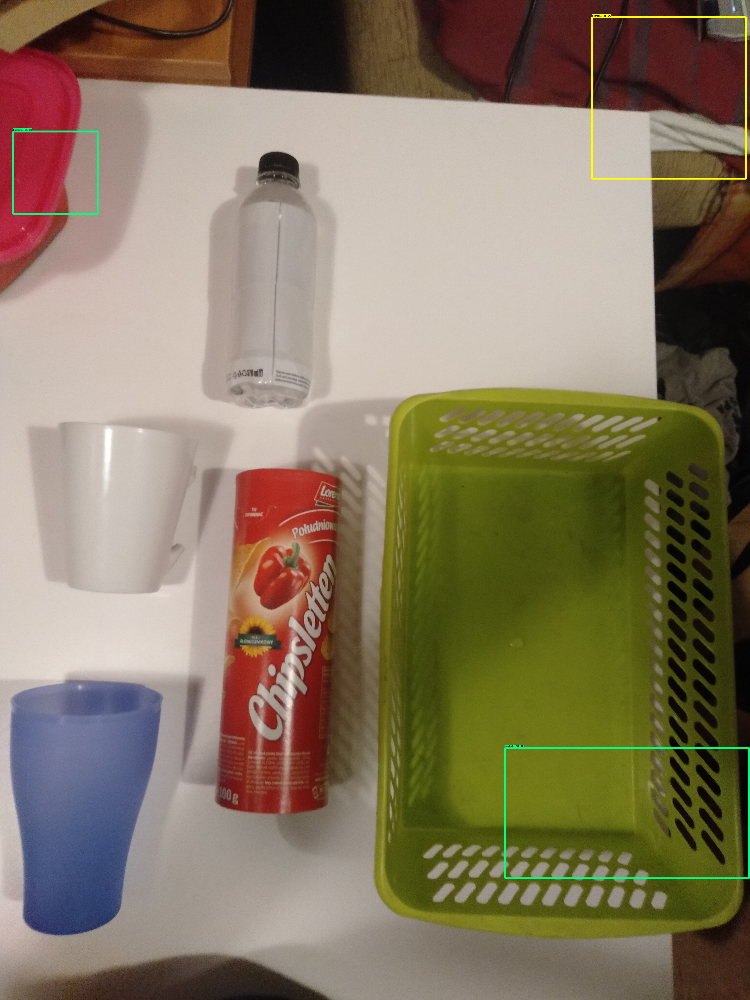

In [52]:

# Define input and output tensors (i.e. data) for the object detection classifier

# Input tensor is the image
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

# Output tensors are the detection boxes, scores, and classes
# Each box represents a part of the image where a particular object was detected
detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

# Each score represents level of confidence for each of the objects.
# The score is shown on the result image, together with the class label.
detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

# Number of objects detected
num_detections = detection_graph.get_tensor_by_name('num_detections:0')

# Load image using OpenCV and
# expand image dimensions to have shape: [1, None, None, 3]
# i.e. a single-column array, where each item in the column has the pixel RGB value
image = cv2.imread(PATH_TO_IMAGE)
image_expanded = np.expand_dims(image, axis=0)

# Perform the actual detection by running the model with the image as input
(boxes, scores, classes, num) = sess.run(
    [detection_boxes, detection_scores, detection_classes, num_detections],
    feed_dict={image_tensor: image_expanded})

# Draw the results of the detection (aka 'visulaize the results')

vis_util.visualize_boxes_and_labels_on_image_array(
    image,
    np.squeeze(boxes),
    np.squeeze(classes).astype(np.int32),
    np.squeeze(scores),
    category_index,
    use_normalized_coordinates=True,
    line_thickness=8,
    min_score_thresh=0.50)

# All the results have been drawn on image. Now display the image.
cv2_imshow(image)

# Press any key to close the image
#cv2.waitKey(0)

# Clean up
#cv2.destroyAllWindows()

In [53]:
(boxes, scores, classes, num)

(array([[[0.01752027, 0.78924567, 0.17854282, 0.9948284 ],
         [0.13153322, 0.01746733, 0.21356127, 0.13015649],
         [0.74799794, 0.67302835, 0.87831044, 0.9991091 ],
         ...,
         [0.38240826, 0.8721453 , 0.6244658 , 1.        ],
         [0.92139035, 0.09661801, 0.986893  , 0.23452723],
         [0.9292017 , 0.6813375 , 0.9831926 , 0.84545654]]], dtype=float32),
 array([[0.54544187, 0.5120923 , 0.5080891 , 0.49950975, 0.4876372 ,
         0.47359636, 0.46297476, 0.45110005, 0.44790515, 0.44310364,
         0.4414807 , 0.43943453, 0.4312035 , 0.42953998, 0.42881975,
         0.41862383, 0.41397527, 0.41114765, 0.4061357 , 0.4059252 ,
         0.40581578, 0.40489894, 0.40186664, 0.40163833, 0.39938593,
         0.39742193, 0.39361152, 0.3903607 , 0.39015606, 0.38951916,
         0.38826373, 0.38313797, 0.381774  , 0.38033482, 0.38030955,
         0.37945297, 0.37916046, 0.379085  , 0.37870532, 0.37653664,
         0.37642083, 0.3758704 , 0.37474772, 0.3740439 , 0.370